# Основы глубинного обучения, майнор ИАД

## Домашнее задание 1. Введение в PyTorch. Полносвязные нейронные сети.

### Общая информация

Дата выдачи: 01.10.2023

Мягкий дедлайн: 23:59MSK 15.10.2023

Жесткий дедлайн: 23:59MSK 20.10.2023

### Оценивание и штрафы
Максимально допустимая оценка за работу — 10 баллов. За каждый день просрочки снимается 1 балл. Сдавать задание после жёсткого дедлайна сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.
Также оценка может быть снижена за плохо читаемый код и плохо оформленные графики. Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.

Итогова оценка считается как
$$
min(task_1, task_2)*0.8 + max(task_1, task_2)*0.2
$$

где task_1 и task_2 - оценки за первое и второе заданиее соответсвенно.
Также, за домашнее задание выставляется 0, если не сделано нулевое или третье задание.
### О задании

В этом задании вам предстоит предсказывать год выпуска песни (**задача регрессии**) по некоторым звуковым признакам: [данные](https://archive.ics.uci.edu/ml/datasets/yearpredictionmsd). В ячейках ниже находится код для загрузки данных. Обратите внимание, что обучающая и тестовая выборки располагаются в одном файле, поэтому НЕ меняйте ячейку, в которой производится деление данных.

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import pandas as pd
import numpy as np
import random
device = "cuda" if torch.cuda.is_available() else "cpu"
from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt

In [2]:
!wget -O data.txt.zip https://archive.ics.uci.edu/ml/machine-learning-databases/00203/YearPredictionMSD.txt.zip

--2023-10-20 11:51:47--  https://archive.ics.uci.edu/ml/machine-learning-databases/00203/YearPredictionMSD.txt.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘data.txt.zip’

data.txt.zip            [             <=>    ] 201.24M  76.9MB/s    in 2.6s    

2023-10-20 11:51:50 (76.9 MB/s) - ‘data.txt.zip’ saved [211011981]



In [3]:
df = pd.read_csv('data.txt.zip', header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
0,2001,49.94357,21.47114,73.07750,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.01620,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
1,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
2,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
3,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
4,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903


Мы вывели кусок данных, чтобы понять, насколько они пригодны для работы без изменений. Здесь ясно, что сомнительно дальше с такими данными работать, потому что как минимум есть отрицательные значения, которые не отмасштабированы, кроме того еще сразу бросается в глаза совсем разная размерность, где-то видим реально большие числа, а где-то 0.075. Ясно, что будем скейлить.

In [24]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

train_size = 463715
X_train = X[:train_size, :]
Y_train = y[:train_size]
X_test = X[train_size:, :]
Y_test = y[train_size:]

## Задание 0. (0 баллов, но при невыполнении максимум за все задание &mdash; 0 баллов)

Мы будем использовать RMSE как метрику качества. Для самого первого бейзлайна обучите `Ridge` регрессию из `sklearn`. Кроме того, посчитайте качество при наилучшем константном прогнозе.

Для выполнения данного задания (и всех последующих) предобработайте данные.

1. Зафиксируйте random_seed везде где только возможно. Вам предоставлена функция для этого, однако вы можете дополнить ее своими дополнениями
2. Обучите StandertScaler и предобработайте ваши данные. В следующих заданиях можете использовать другой scaler или вообще отказаться от него


In [25]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import Ridge
scaler = StandardScaler()

In [26]:
def set_random_seed(seed):
    torch.backends.cudnn.deterministic = True
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    # Add smth here if you need...

In [27]:
set_random_seed(42)

In [28]:
X_train0 = scaler.fit_transform(X_train)
X_test0 = scaler.transform(X_test)

In [29]:
X_train0[0]

array([ 1.07878578,  0.3915658 ,  1.82696245,  0.46636105, -0.47662115,
       -0.27526629, -1.55192415, -1.31110548,  0.38909312, -0.66540202,
        0.79302657, -0.58349295, -1.05561566, -1.04391929, -0.80367323,
       -0.74468803, -1.05439336, -0.85640479, -0.87344064, -0.90096173,
       -0.66511729, -0.83472917, -1.00913642, -0.73473292, -0.42344137,
       -0.50486622,  0.2609419 ,  0.34865417, -0.67539413, -0.46512286,
       -0.03396927,  0.14553015,  0.02528479,  0.10327689,  0.16877324,
       -0.67714125, -0.19725458, -0.44291426,  0.58447807,  0.2422846 ,
       -0.30139733, -0.18038045,  0.37562545, -0.42750284,  0.41997005,
       -0.45514989,  0.00766528,  0.37219657,  0.36218993,  0.05146461,
       -0.33800239, -0.42913103,  0.00884663,  0.47686471,  0.04980098,
       -0.31090432,  0.00354332,  0.2409638 , -0.07628686, -0.11420628,
       -0.19381773,  0.15424497, -0.27204222,  0.13869767, -0.36731062,
       -0.28070465,  0.01605593,  0.3694421 , -0.03599048,  0.18

In [30]:
model = Ridge()
model.fit(X_train0,Y_train)
y_preds = model.predict(X_test0)

rmse_for_model = np.sqrt(np.mean((y_preds - Y_test) ** 2))

In [31]:
print(rmse_for_model)

9.510160820470436


Лучшая константа для RMSE это среднее, посчитаем значение метрики при нем

In [32]:
best_rmse_metric = np.sqrt(np.mean((Y_test.mean() - Y_test) ** 2))
print(best_rmse_metric)

10.851909820717683


## Задание 1. (максимум 10 баллов)

Закрепите свои знания о том, как pytorch работает с обратным распространением ошибки, проделав следующие шаги:

1. Создайте модель линейной регрессии, которая будет состоять только из одного Linear слоя.
2. Напишите цикл обучения вашей линейной регрессии. В нем реализуйте подсчет функции потерь, сделайте шаг градиентного спуска. Запрещено использовать готовые оптимизаторы и loss-функции из библиотеки pytorch. Для подсчета градиента воспользуйтесь методом backward.
3. Запустите обучение на 10 эпохах, после каждой проверяйте значение целевой метрики на тестовой выборке.
4. Выведите на экран графики метрики и значения функции потерь на тестовой и обучающей выборке.

В данном задании нет цели побить какой-то порог по метрике. Ваша задача - убедиться в том, что ваш рукописный цикл обучения работает. Для ускорения вычислений и обучения модели можете брать только срез данных, а не весь датасет.

In [42]:
# ⸂⸂⸜(രᴗര๑)⸝⸃⸃ Good luck!
w = torch.rand(1, requires_grad=True)
b = torch.rand(1, requires_grad=True)

In [43]:
# ⸂⸂⸜(രᴗര๑)⸝⸃⸃ Good luck!
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.lin = nn.Linear(90, 1)

    def forward(self, x):
       return self.lin(x)

model = Model()

In [44]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [45]:
n_epochs = 10

X_train = torch.tensor(X_train0, dtype=torch.float32) #normalised
y_train = torch.tensor(Y_train, dtype=torch.float32)
X_test = torch.tensor(X_test0, dtype=torch.float32) #normalised
y_test = torch.tensor(Y_test, dtype=torch.float32)

print(X_train.size(), y_train.size())

torch.Size([463715, 90]) torch.Size([463715])


In [46]:
#from https://www.geeksforgeeks.org/datasets-and-dataloaders-in-pytorch/

class HeartDataSet():

    def __init__(self, x, y):

        # here the 13th column is class label and rest
        # are features
        self.x = x
        self.y = y
        self.n_samples = x.shape[1]

    # support indexing such that dataset[i] can
    # be used to get i-th sample
    def __getitem__(self, index):
        return self.x[index], self.y[index]

    # we can call len(dataset) to return the size
    def __len__(self):
        return self.n_samples

In [47]:
train_dataset = HeartDataSet(X_train[:2000], y_train[:2000])
test_dataset = HeartDataSet(X_test[:2000], y_test[:2000])

In [48]:
from torch.utils.data import DataLoader

In [49]:
train_dataloader = DataLoader(train_dataset, batch_size=50, shuffle=True)
val_dataloader = DataLoader(test_dataset, batch_size=50, shuffle=False)

In [50]:
 def plot(val_losses, val_metrics, train_losses, train_metrics):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].plot(range(1, len(val_losses) + 1), val_losses, label='val')
    axs[0].plot(range(1, len(train_losses) + 1), train_losses, label='train')

    axs[1].plot(range(1, len(val_metrics) + 1), val_metrics, label='val')
    axs[1].plot(range(1, len(train_metrics) + 1), train_metrics, label='train')

    for ax in axs:
        ax.set_xlabel('epoch')
        ax.legend()

    axs[0].set_ylabel('loss')
    axs[1].set_ylabel('RMSE')
    plt.show()

In [51]:
#from seminar
train_per_batch_loss = []
train_per_batch_metric = []
test_per_batch_loss = []
test_per_batch_metric = []
for epoch in range(n_epochs):
          # тренировка
          train_loss = []
          train_metric = []
          for x, y in tqdm(train_dataloader):
            y_pred = model(x)
            loss = torch.mean((y_pred - y) ** 2)
            loss.backward()
            # делаем шаг градиентного спуска с lr = .05
            model.lin.weight.data -= 0.05 * model.lin.weight.grad
            model.lin.bias.data -= 0.05 * model.lin.bias.grad
            # обнуляем градиенты, чтобы на следующем шаге опять посчитать и не аккумулировать их
            model.lin.weight.grad.data.zero_()
            model.lin.bias.grad.data.zero_()

            train_loss.append(loss.detach().numpy())  # добавляем в массив
            train_metric.append(torch.sqrt(loss).detach().numpy())

          test_loss = []
          test_metric = []
          with torch.no_grad():
            for x_val, y_val in tqdm(val_dataloader):  # берем батч из валидационного лоадера
              y_pred = model(x_val)  # делаем предсказания
              #print(np.sqrt(np.mean((y_pred - y_val) ** 2)))
              loss = torch.mean((y_pred - y_val) ** 2)
              rmse = torch.sqrt(loss)
              test_loss.append(loss.numpy())  # добавляем в массив
              test_metric.append(rmse)

          test_per_batch_loss.append(np.mean(test_loss))
          test_per_batch_metric.append(np.mean(test_metric))
          train_per_batch_loss.append(np.mean(train_loss))
          train_per_batch_metric.append(np.mean(train_metric))
          print(f"Epoch: {epoch}, loss: {np.mean(test_loss)}, metric (rmse): {np.mean(test_metric)}")


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 0, loss: 1930827.5, metric (rmse): 1377.0684814453125


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1, loss: 1819529.875, metric (rmse): 1321.2108154296875


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2, loss: 1628234.125, metric (rmse): 1244.9134521484375


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3, loss: 1502272.0, metric (rmse): 1201.9482421875


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4, loss: 1384649.5, metric (rmse): 1150.65576171875


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5, loss: 1322628.875, metric (rmse): 1124.2879638671875


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6, loss: 1243923.125, metric (rmse): 1091.436279296875


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7, loss: 1199733.5, metric (rmse): 1070.9879150390625


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8, loss: 1135287.25, metric (rmse): 1044.380615234375


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9, loss: 1118726.5, metric (rmse): 1033.2191162109375


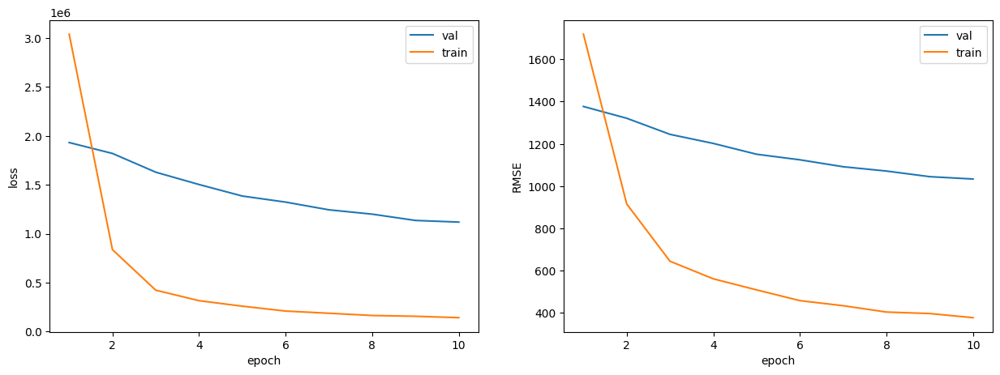

In [52]:
plot(test_per_batch_loss, test_per_batch_metric, train_per_batch_loss, train_per_batch_metric)

## Задание 2. (максимум 10 баллов)

Реализуйте обучение и тестирование нейронной сети для предоставленного вам набора данных. Соотношение между полученным значением метрики на тестовой выборке и баллами за задание следующее:

- $\text{RMSE} \le 9.00 $ &mdash; 4 балла
- $\text{RMSE} \le 8.90 $ &mdash; 6 баллов
- $\text{RMSE} \le 8.80 $ &mdash; 8 баллов
- $\text{RMSE} \le 8.75 $ &mdash; 10 баллов

Есть несколько правил, которых вам нужно придерживаться:

- Весь пайплайн обучения должен быть написан на PyTorch. При этом вы можете пользоваться другими библиотеками (`numpy`, `sklearn` и пр.), но только для обработки данных. То есть как угодно трансформировать данные и считать метрики с помощью этих библиотек можно, а импортировать модели из `sklearn` и выбивать с их помощью требуемое качество &mdash; нельзя. Также нельзя пользоваться библиотеками, для которых сам PyTorch является зависимостью.

- Мы никак не ограничиваем ваш выбор архитектуры модели, но скорее всего вам будет достаточно полносвязной нейронной сети.

- Для обучения запрещается использовать какие-либо иные данные, кроме обучающей выборки.

- Ансамблирование моделей запрещено.

### Полезные советы:

- Очень вряд ли, что у вас с первого раза получится выбить качество на 10 баллов, поэтому пробуйте разные архитектуры, оптимизаторы и значения гиперпараметров. В идеале при запуске каждого нового эксперимента вы должны менять что-то одно, чтобы точно знать, как этот фактор влияет на качество.

- Не забудьте, что для улучшения качества модели вам поможет **нормировка таргета**.

- Тот факт, что мы занимаемся глубинным обучением, не означает, что стоит забывать про приемы, использующиеся в классическом машинном обучении. Так что обязательно проводите исследовательский анализ данных, отрисовывайте нужные графики и не забывайте про масштабирование и подбор гиперпараметров.

- Вы наверняка столкнетесь с тем, что ваша нейронная сеть будет сильно переобучаться. Для нейросетей существуют специальные методы регуляризации, например, dropout ([статья](https://jmlr.org/papers/volume15/srivastava14a/srivastava14a.pdf)) и weight decay ([блогпост](https://towardsdatascience.com/weight-decay-l2-regularization-90a9e17713cd)). Они, разумеется, реализованы в PyTorch. Попробуйте поэкспериментировать с ними.

- Если вы чего-то не знаете, не гнушайтесь гуглить. В интернете очень много полезной информации, туториалов и советов по глубинному обучению в целом и по PyTorch в частности. Но не забывайте, что за скатанный код без ссылки на источник придется ответить по всей строгости!

- Если вы сразу реализуете обучение на GPU, то у вас будет больше времени на эксперименты, так как любые вычисления будут работать быстрее. Google Colab предоставляет несколько GPU-часов (обычно около 8-10) в сутки бесплатно.

- Чтобы отладить код, можете обучаться на небольшой части данных или даже на одном батче. Если лосс на обучающей выборке не падает, то что-то точно идет не так!

- Пользуйтесь утилитами, которые вам предоставляет PyTorch (например, Dataset и Dataloader). Их специально разработали для упрощения разработки пайплайна обучения.

- Скорее всего вы захотите отслеживать прогресс обучения. Для создания прогресс-баров есть удобная библиотека `tqdm`.

- Быть может, вы захотите, чтобы графики рисовались прямо во время обучения. Можете воспользоваться функцией [clear_output](http://ipython.org/ipython-doc/dev/api/generated/IPython.display.html#IPython.display.clear_output), чтобы удалять старый график и рисовать новый на его месте.

**ОБЯЗАТЕЛЬНО** рисуйте графики зависимости лосса/метрики на обучающей и тестовой выборках в зависимости от времени обучения. Если обучение занимает относительно небольшое число эпох, то лучше рисовать зависимость от номера шага обучения, если же эпох больше, то рисуйте зависимость по эпохам. Если проверяющий не увидит такого графика для вашей лучшей модели, то он в праве снизить баллы за задание.

**ВАЖНО!** Ваше решение должно быть воспроизводимым. Если это не так, то проверяющий имеет право снизить баллы за задание. Чтобы зафиксировать random seed, воспользуйтесь функцией из предыдущего задания.



Вы можете придерживаться любой адекватной струкуры кода, но мы советуем воспользоваться сигнатурами функций, которые приведены ниже. Лучше всего, если вы проверите ваши предсказания ассертом: так вы убережете себя от разных косяков, например, что вектор предсказаний состоит из всего одного числа. В любом случае, внимательно следите за тем, для каких тензоров вы считаете метрику RMSE. При случайном или намеренном введении в заблуждение проверяющие очень сильно разозлятся.

In [95]:
from sklearn.preprocessing import StandardScaler

In [96]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

train_size = 463715
X_train = X[:train_size, :]
y_train = y[:train_size]
X_test = X[train_size:, :]
y_test = y[train_size:]

In [97]:
class MyDataset():

    def __init__(self, x, y):
        self.x = torch.from_numpy(x).to(torch.float32)
        self.y = torch.from_numpy(y).to(torch.float32)

    def __getitem__(self, index):
        return self.x[index], self.y[index]

    def __len__(self):
        return len(self.x)

In [98]:
train_set = MyDataset(X_train, y_train)
train_loader = torch.utils.data.DataLoader(train_set, batch_size=64, shuffle = True)

test_set = MyDataset(X_test, y_test)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=64, shuffle = False)

batch = next(iter(test_loader))
print(f"Sample:\n{batch[0]}")

model = nn.Sequential(nn.Linear(90, 1))
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
criterion = nn.MSELoss()

Sample:
tensor([[  45.4420,  -30.7498,   31.7859,  ...,   -3.8625,   36.4240,
            7.1731],
        [  52.6781,   -2.8891,   43.9527,  ...,   -4.0097,  -68.9621,
           -5.2153],
        [  45.7424,   12.0229,   11.0301,  ...,  -10.9252,   26.7535,
           -5.7874],
        ...,
        [  47.7314,   -3.1700,   17.0467,  ...,   -0.8861,  -73.9594,
           -3.1427],
        [  46.9365,   22.9727,    5.2681,  ...,  -10.1874, -120.7741,
          -16.3414],
        [  46.5957,   -1.1796,  -11.7283,  ...,   -3.5967,    6.0156,
           -2.2022]])


In [99]:
def plot_history(train_history, val_history, title="loss"):
    plt.figure()
    plt.title(title)
    plt.plot(train_history, label="train", zorder=1)

    points = np.array(val_history)
    steps = list(
        range(0, len(train_history) + 1, int(len(train_history) / len(val_history)))
    )[1:]

    plt.scatter(
        steps, val_history, marker="+", s=180, c="orange", label="val", zorder=2
    )
    plt.xlabel("train steps")

    plt.legend(loc="best")
    plt.grid()

    plt.show()

In [100]:
def train(model, optimizer, criterion, train_loader, test_loader, target_norm, epochs):
    """
    params:
        model - torch.nn.Module to be fitted
        optimizer - model optimizer
        criterion - loss function from torch.nn
        train_loader - torch.utils.data.Dataloader with train set
        test_loader - torch.utils.data.Dataloader with test set
                      (if you wish to validate during training)
    """
    scaler = StandardScaler()
    set_random_seed(42)
    # YOUR CODE HERE (－.－)...zzzZZZzzzZZZ
    train_loss_log, train_rmse_log, val_loss_log, val_rmse_log = [], [], [], []
    tr_epoch_loss = []
    tr_epoch_rmse = []
    test_losses = []
    test_rmses = []

    for epoch in range(epochs):
      model.train()
      train_epoch_loss, train_epoch_rmse = torch.empty(0), torch.empty(0)

      for x, y in tqdm(train_loader, desc=f"Training, epoch {epoch}", leave=False):
        y_pred = model(x)

        if target_norm:
          y = torch.from_numpy(scaler.fit_transform(y.reshape(-1, 1))).to(torch.float32) ##mal. zn-ya
          #y = normalize(y)

        loss = criterion(y_pred, y.to(torch.float32))
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        if target_norm:
          y = torch.from_numpy(scaler.inverse_transform(y)).to(torch.float32) ##return to big
          y_pred = torch.from_numpy(scaler.inverse_transform(y_pred.detach().numpy())).to(torch.float32) ##return to big

        metric = torch.sqrt(criterion(y_pred, y))
        # log loss for the current epoch and the whole training history

        train_epoch_loss = torch.cat((train_epoch_loss, loss.cpu().unsqueeze(0)))
        train_loss_log.append(loss.cpu().data)
        # metric rmse for the current epoch and the whole training history
        train_epoch_rmse = torch.cat(
              (train_epoch_rmse, metric.cpu().unsqueeze(0))
          )
        train_rmse_log.append(metric.cpu().data)
        tr_epoch_loss.append(loss.cpu().data)
        tr_epoch_rmse.append(metric.cpu().data)

      # валидация
      model.eval()
      val_epoch_loss, val_epoch_loss_for_metric = torch.empty(0), torch.empty(0)
      test_epoch_loss = []
      test_epoch_rmse = []
      with torch.no_grad():
        for x, y in tqdm(test_loader, desc=f"Validating, epoch {epoch}", leave=False):
          y_pred = model(x)

          if target_norm:
            y = torch.from_numpy(scaler.transform(y.reshape(-1, 1))).to(torch.float32) ##make small
          loss = criterion(y_pred, y)

          if target_norm:
            y_pred = torch.from_numpy(scaler.inverse_transform(y_pred.detach().numpy())).to(torch.float32)
            y = torch.from_numpy(scaler.inverse_transform(y.detach().numpy())).to(torch.float32)

          loss_for_metric = criterion(y_pred, y)

          #loss = loss_for_metric
          val_epoch_loss = torch.cat((val_epoch_loss, loss.cpu().unsqueeze(0)))
          val_epoch_loss_for_metric = torch.cat((val_epoch_loss_for_metric, loss_for_metric.cpu().unsqueeze(0)))
          test_epoch_loss.append(loss.cpu().data)
          test_epoch_rmse.append(loss_for_metric.cpu().data)

        val_rmse_log.append(np.sqrt(np.mean(test_epoch_rmse)))
        val_loss_log.append(np.mean(test_epoch_loss))

      clear_output()


      plot_history(tr_epoch_loss, val_loss_log, "loss")
      plot_history(tr_epoch_rmse, val_rmse_log, "rmse")

      print("Train loss:", train_epoch_loss.mean().item())
      print(
            "Train acc:", train_epoch_rmse.mean().item(),
      )
      print("Val loss:", val_epoch_loss.mean().item())
      print(
            "Val acc:", torch.sqrt(val_epoch_loss_for_metric.mean()).item(),
      )
      print('val_rmse_log', val_rmse_log)



def test(model, criterion, test_loader):
    """
    params:
        model - torch.nn.Module to be evaluated on test set
        criterion - loss function from torch.nn
        test_loader - torch.utils.data.Dataloader with test set
    ----------
    returns:
        predicts - torch.tensor with shape (len(test_loader.dataset), ),
                   which contains predictions for test objects
    """
    # YOUR CODE HERE (－.－)...zzzZZZzzzZZZ
    predicts = torch.ones(len(test_loader.dataset))
    return predicts


In [101]:
def test(model, criterion, test_loader):
    """
    params:
        model - torch.nn.Module to be evaluated on test set
        criterion - loss function from torch.nn
        test_loader - torch.utils.data.Dataloader with test set
    ----------
    returns:
        predicts - torch.tensor with shape (len(test_loader.dataset), ),
                   which contains predictions for test objects
    """
    model.eval()
    # YOUR CODE HERE (－.－)...zzzZZZzzzZZZ

    predicts = torch.empty(0)
    val_loss = [] # сюда будем складывать **средний по бачу** лосс
    rmse_ = []

    with torch.no_grad():
          test_loss_log, rmse_test_epoch= [], []
          for x, y in tqdm(test_loader):
              x, y = x.to(device), y.to(device)

              y_pred = model(x)
              loss = criterion(y_pred.flatten(), y)

              val_loss.append(loss.cpu().numpy()) # добавляем в массив

              rmse = torch.sqrt(loss)
              rmse_.append(rmse)
              #print(rmse)
              predicts = torch.cat((predicts, y_pred))

    print('Total RMSE:', np.mean(rmse_))
    return predicts

In [102]:
assert test(model, criterion, test_loader).shape[0] == y_test.shape[0]

  0%|          | 0/807 [00:00<?, ?it/s]

Total RMSE: 1671.9484


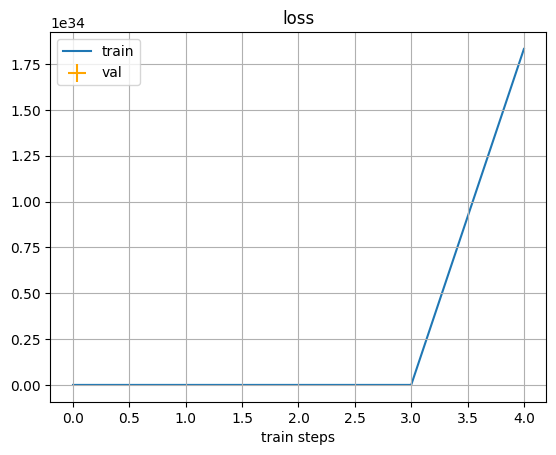

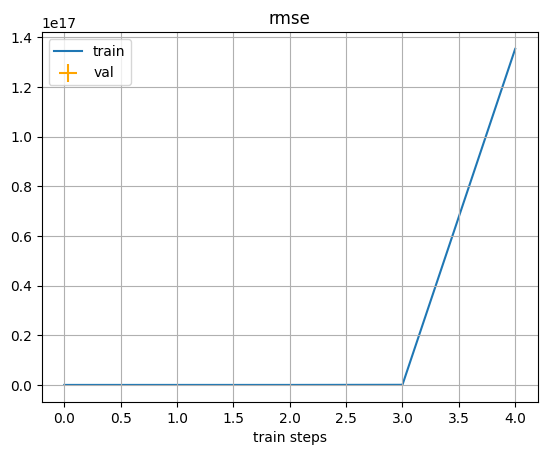

Train loss: nan
Train acc: nan
Val loss: nan
Val acc: nan
val_rmse_log [nan, nan]


In [103]:
# ೭੧(❛〜❛✿)੭೨ Go forward!
model = nn.Sequential(nn.Linear(90, 1))
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader, test_loader, False, 2)

#Добавим нормализацию:

In [104]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

X_train = X[:train_size, :]
y_train = y[:train_size]
X_test = X[train_size:, :]
y_test = y[train_size:]

In [105]:
scaler = StandardScaler()
X_train1 = scaler.fit_transform(X_train) #normalised
X_test1 = scaler.transform(X_test) #normalised

In [106]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=64, shuffle = True)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=64, shuffle =  False)

batch = next(iter(test_loader1))
print(f"Sample:\n{batch[0]}")


Sample:
tensor([[ 0.3383, -0.6202,  0.6561,  ..., -0.6236,  0.0903,  0.2654],
        [ 1.5286, -0.0804,  1.0011,  ..., -0.6347, -0.4799, -0.2966],
        [ 0.3877,  0.2085,  0.0675,  ..., -1.1538,  0.0379, -0.3226],
        ...,
        [ 0.7149, -0.0859,  0.2381,  ..., -0.4002, -0.5069, -0.2026],
        [ 0.5841,  0.4207, -0.0959,  ..., -1.0984, -0.7602, -0.8013],
        [ 0.5281, -0.0473, -0.5779,  ..., -0.6037, -0.0742, -0.1599]])


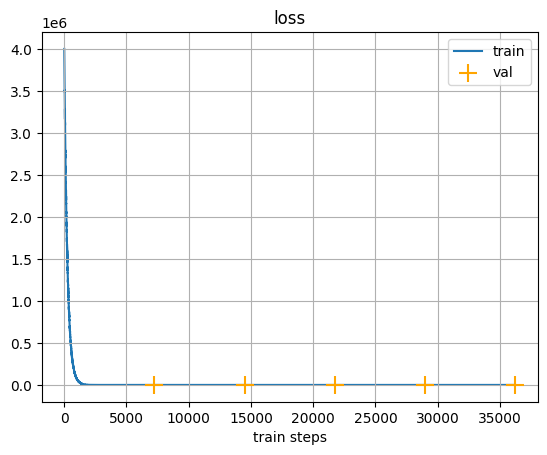

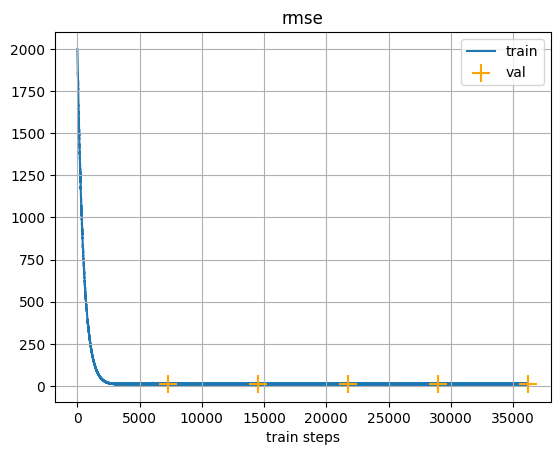

Train loss: 119.67365264892578
Train acc: 10.829666137695312
Val loss: 117.3343276977539
Val acc: 10.832097053527832
val_rmse_log [10.850558, 10.840589, 10.838053, 10.835521, 10.832098]


In [107]:
# ೭੧(❛〜❛✿)੭೨ Go forward!
model = nn.Sequential(nn.Linear(90, 1))
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, False, 5)

#decrease lr to 0.0001

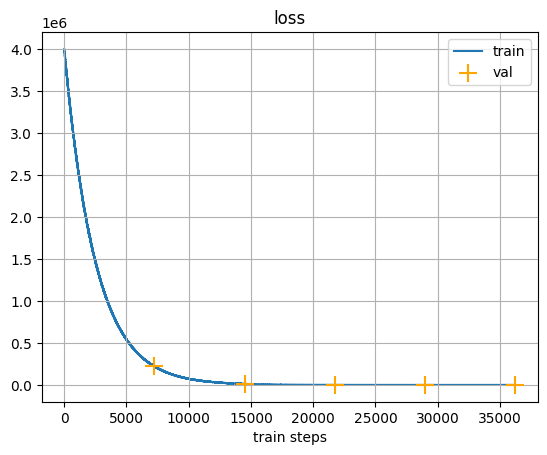

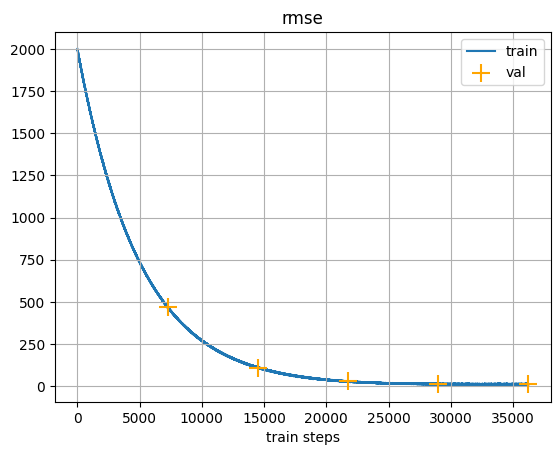

Train loss: 131.7409210205078
Train acc: 11.402276039123535
Val loss: 119.7265396118164
Val acc: 10.941962242126465
val_rmse_log [469.35953, 110.73247, 28.119232, 12.468347, 10.941962]


In [108]:

model = nn.Sequential(nn.Linear(90, 1))
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, False, 5)
#if increase lr to 0.1 - stagnate

#Добавим нормализацию таргета. y norm:

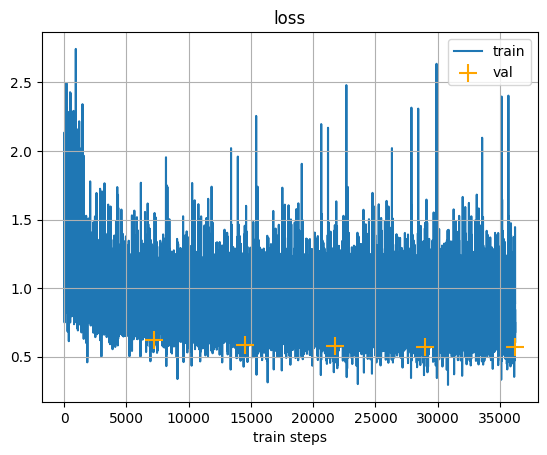

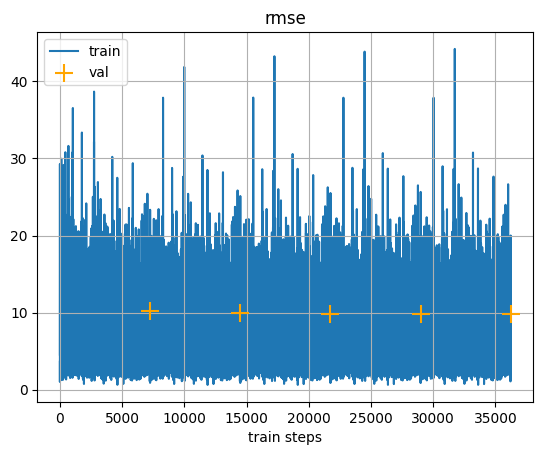

Train loss: 0.8748355507850647
Train acc: 7.2261576652526855
Val loss: 0.569740355014801
Val acc: 9.768156051635742
val_rmse_log [10.210154, 9.917646, 9.825464, 9.786961, 9.768156]


In [109]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=64)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=64)

model = nn.Sequential(nn.Linear(90, 1))
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)
#increase batch size from 32 to 64

#increase lr to 0.001

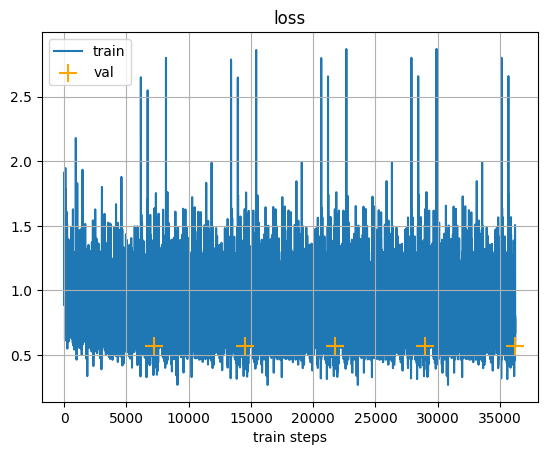

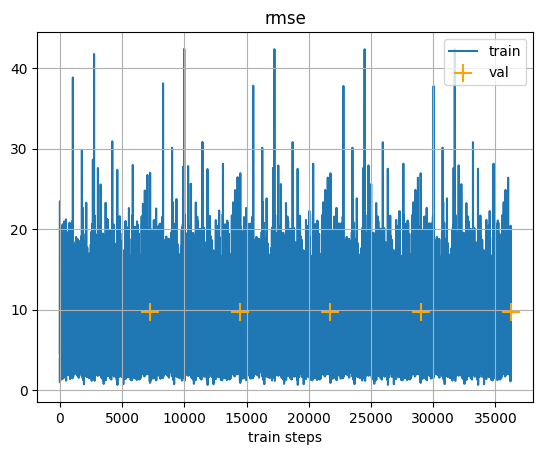

Train loss: 0.8745889663696289
Train acc: 7.21555757522583
Val loss: 0.5675143599510193
Val acc: 9.749054908752441
val_rmse_log [9.755469, 9.749521, 9.749195, 9.749102, 9.749055]


In [110]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=64)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=64)

model = nn.Sequential(nn.Linear(90, 1))
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)
#increase batch size from 32 to 64

#Посмотрим на влияние lr and batch-size

In [ ]:
def train_best_param(model, optimizer, criterion, train_loader, test_loader, target_norm, epochs):
    scaler = StandardScaler()
    set_random_seed(42)

    train_loss_log, train_rmse_log, val_loss_log, val_rmse_log = [], [], [], []
    tr_epoch_loss = []
    tr_epoch_rmse = []
    test_losses = []
    test_rmses = []

    for epoch in range(epochs):
      model.train()
      train_epoch_loss, train_epoch_rmse = torch.empty(0), torch.empty(0)

      for x, y in tqdm(train_loader, desc=f"Training, epoch {epoch}", leave=False):
        y_pred = model(x)

        if target_norm:
          y = torch.from_numpy(scaler.fit_transform(y.reshape(-1, 1))).to(torch.float32) ##mal. zn-ya

        loss = criterion(y_pred, y.to(torch.float32))
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        if target_norm:
          y = torch.from_numpy(scaler.inverse_transform(y)).to(torch.float32) ##return to big
          y_pred = torch.from_numpy(scaler.inverse_transform(y_pred.detach().numpy())).to(torch.float32) ##return to big

        metric = torch.sqrt(criterion(y_pred, y))

        train_epoch_loss = torch.cat((train_epoch_loss, loss.cpu().unsqueeze(0)))
        train_loss_log.append(loss.cpu().data)

        train_epoch_rmse = torch.cat(
              (train_epoch_rmse, metric.cpu().unsqueeze(0))
          )
        train_rmse_log.append(metric.cpu().data)
        tr_epoch_loss.append(loss.cpu().data)
        tr_epoch_rmse.append(metric.cpu().data)

      # валидация
      model.eval()
      val_epoch_loss, val_epoch_loss_for_metric = torch.empty(0), torch.empty(0)
      test_epoch_loss = []
      test_epoch_rmse = []
      with torch.no_grad():
        for x, y in tqdm(test_loader, desc=f"Validating, epoch {epoch}", leave=False):
          y_pred = model(x)

          if target_norm:
            y = torch.from_numpy(scaler.transform(y.reshape(-1, 1))).to(torch.float32) ##make small
          loss = criterion(y_pred, y)

          if target_norm:
            y_pred = torch.from_numpy(scaler.inverse_transform(y_pred.detach().numpy())).to(torch.float32)
            y = torch.from_numpy(scaler.inverse_transform(y.detach().numpy())).to(torch.float32)

          loss_for_metric = criterion(y_pred, y)

          val_epoch_loss = torch.cat((val_epoch_loss, loss.cpu().unsqueeze(0)))
          val_epoch_loss_for_metric = torch.cat((val_epoch_loss_for_metric, loss_for_metric.cpu().unsqueeze(0)))
          test_epoch_loss.append(loss.cpu().data)
          test_epoch_rmse.append(loss_for_metric.cpu().data)

        val_rmse_log.append(np.sqrt(np.mean(test_epoch_rmse)))
        val_loss_log.append(np.mean(test_epoch_loss))


    print("Train loss:", train_epoch_loss.mean().item())
    print(
          "Train acc:", train_epoch_rmse.mean().item(),
    )
    print("Val loss:", val_epoch_loss.mean().item())
    print(
          "Val acc:", torch.sqrt(val_epoch_loss_for_metric.mean()).item(),
    )
    print('val_rmse_log', val_rmse_log)

In [ ]:
for l in [.0001]:
  for b in reversed([32, 64, 128, 256, 512, 1024]):
    train_set1 = MyDataset(X_train1, y_train)
    train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=b)

    test_set1 = MyDataset(X_test1, y_test)
    test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=b)

    model = nn.Sequential(nn.Linear(90, 1))
    optimizer = torch.optim.SGD(model.parameters(), lr=l)
    #scheduler = ExponentialLR(optimizer, gamma=0.9)
    criterion = nn.MSELoss()
    train_best_param(model, optimizer, criterion, train_loader1, test_loader1, True, 5)
    print('batch =',b, 'lr =', l)

Training, epoch 0:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/51 [00:00<?, ?it/s]

Train loss: 0.967778205871582
Train acc: 10.422280311584473
Val loss: 0.8941347002983093
Val acc: 10.887635231018066
val_rmse_log [12.077761, 11.56755, 11.260211, 11.047767, 10.887635]
batch = 1024 lr = 0.0001


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.8830158710479736
Train acc: 9.653045654296875
Val loss: 1.007427453994751
Val acc: 10.180197715759277
val_rmse_log [11.012112, 10.644839, 10.429841, 10.2846575, 10.180198]
batch = 512 lr = 0.0001


Training, epoch 0:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/202 [00:00<?, ?it/s]

Train loss: 0.8584335446357727
Train acc: 9.04278564453125
Val loss: 0.6624199151992798
Val acc: 10.127497673034668
val_rmse_log [11.101608, 10.601625, 10.36214, 10.221066, 10.127497]
batch = 256 lr = 0.0001


Training, epoch 0:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/404 [00:00<?, ?it/s]

Train loss: 0.8539001941680908
Train acc: 8.213844299316406
Val loss: 0.6414952874183655
Val acc: 9.966259002685547
val_rmse_log [10.767658, 10.342976, 10.149654, 10.037909, 9.966259]
batch = 128 lr = 0.0001


Training, epoch 0:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/807 [00:00<?, ?it/s]

Train loss: 0.8749614953994751
Train acc: 7.228164196014404
Val loss: 0.5711882710456848
Val acc: 9.780560493469238
val_rmse_log [10.1663065, 9.922218, 9.840015, 9.801597, 9.7805605]
batch = 64 lr = 0.0001


Training, epoch 0:   0%|          | 0/14492 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/1614 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/14492 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/1614 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/14492 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/1614 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/14492 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/1614 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/14492 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/1614 [00:00<?, ?it/s]

Train loss: 0.9207991361618042
Train acc: 6.162782669067383
Val loss: 824.4248657226562
Val acc: 13.535344123840332
val_rmse_log [13.543069, 13.53925, 13.537081, 13.53596, 13.535344]
batch = 32 lr = 0.0001


Training, epoch 0:   0%|          | 0/57965 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/6454 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/57965 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
for l in [.01]:
  for b in reversed([64, 128, 256, 512, 1024]):
    train_set1 = MyDataset(X_train1, y_train)
    train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=b)

    test_set1 = MyDataset(X_test1, y_test)
    test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=b)

    model = nn.Sequential(nn.Linear(90, 1))
    optimizer = torch.optim.SGD(model.parameters(), lr=l)
    #scheduler = ExponentialLR(optimizer, gamma=0.9)
    criterion = nn.MSELoss()
    train_best_param(model, optimizer, criterion, train_loader1, test_loader1, True, 5)
    print('batch =',b, 'lr =', l)

Training, epoch 0:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/51 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/453 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/51 [00:00<?, ?it/s]

Train loss: 0.7759351134300232
Train acc: 9.325072288513184
Val loss: 0.7108163237571716
Val acc: 9.707576751708984
val_rmse_log [9.718933, 9.708734, 9.70783, 9.707639, 9.707577]
batch = 1024 lr = 0.01


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.787236213684082
Train acc: 9.109902381896973
Val loss: 0.8957186937332153
Val acc: 9.599202156066895
val_rmse_log [9.602388, 9.599526, 9.599281, 9.599221, 9.599202]
batch = 512 lr = 0.01


Training, epoch 0:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/202 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/1812 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/202 [00:00<?, ?it/s]

Train loss: 0.8090396523475647
Train acc: 8.775646209716797
Val loss: 0.6350485682487488
Val acc: 9.916054725646973
val_rmse_log [9.915749, 9.916038, 9.916055, 9.916054, 9.916055]
batch = 256 lr = 0.01


Training, epoch 0:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/404 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/3623 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/404 [00:00<?, ?it/s]

Train loss: 0.851527750492096
Train acc: 8.181673049926758
Val loss: 0.6412969827651978
Val acc: 9.964719772338867
val_rmse_log [9.9647665, 9.96472, 9.964719, 9.964719, 9.96472]
batch = 128 lr = 0.01


Training, epoch 0:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 3:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 3:   0%|          | 0/807 [00:00<?, ?it/s]

Training, epoch 4:   0%|          | 0/7246 [00:00<?, ?it/s]

Validating, epoch 4:   0%|          | 0/807 [00:00<?, ?it/s]

Train loss: 0.9202322959899902
Train acc: 7.38682222366333
Val loss: 0.6122247576713562
Val acc: 10.12580394744873
val_rmse_log [10.125805, 10.125804, 10.125804, 10.125804, 10.125804]
batch = 64 lr = 0.01


Training, epoch 0:   0%|          | 0/14492 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/1614 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/14492 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

#we have found that best combination is batch-size = 512 and lr = 0.01. Let's try another architecture

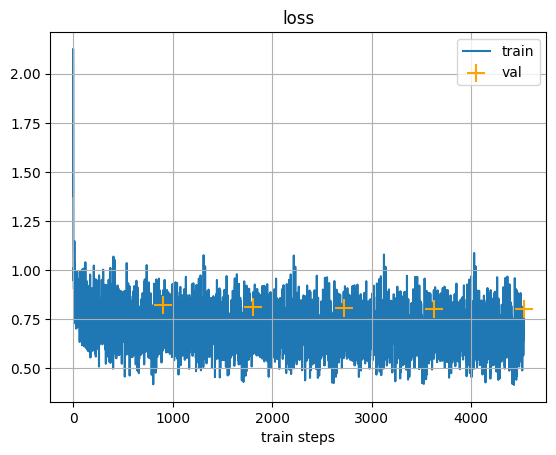

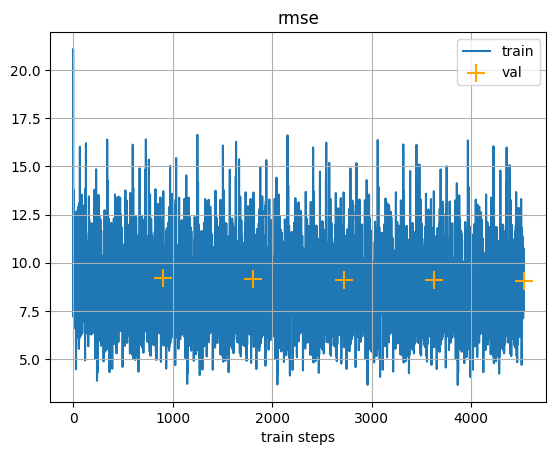

Train loss: 0.6864588856697083
Train acc: 8.49349308013916
Val loss: 0.7998160123825073
Val acc: 9.070773124694824
val_rmse_log [9.187321, 9.142344, 9.101018, 9.088666, 9.070773]


In [111]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 100), nn.ReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

##add more layers. Using only batchnorm
###AND GET RMSE <= 9 !

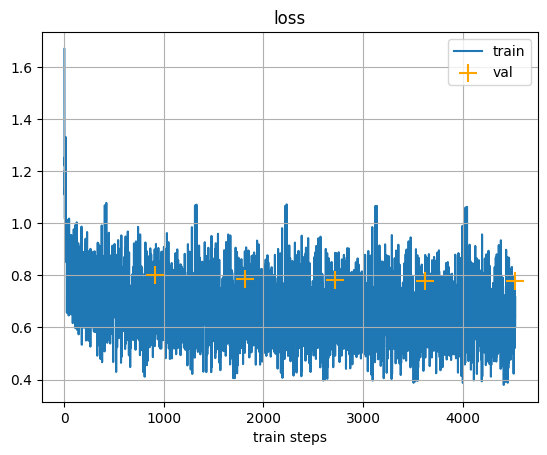

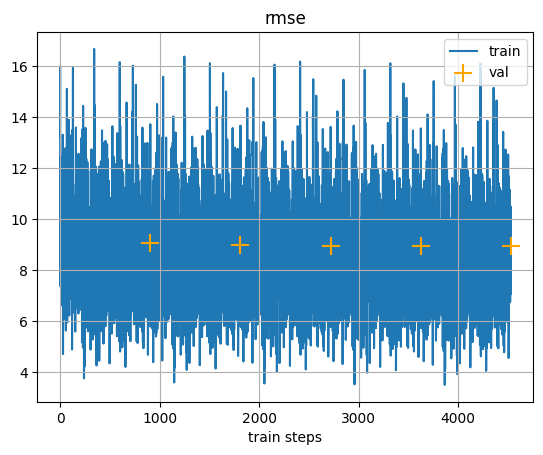

Train loss: 0.6448432803153992
Train acc: 8.224589347839355
Val loss: 0.7769501805305481
Val acc: 8.94017219543457
val_rmse_log [9.07184, 8.996804, 8.961868, 8.946777, 8.940172]


In [112]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 300), nn.ReLU(), nn.BatchNorm1d(300), nn.Linear(300, 100), nn.ReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

#one more batchnorm:

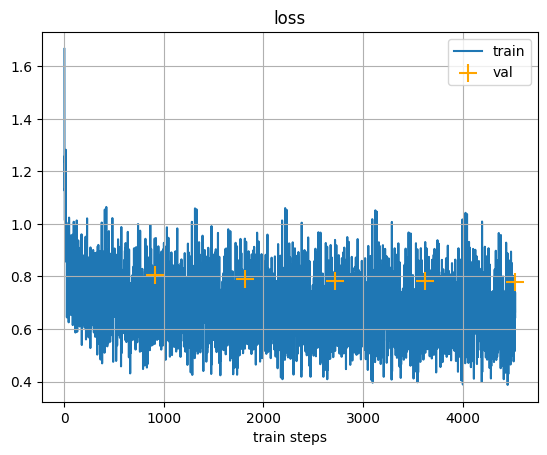

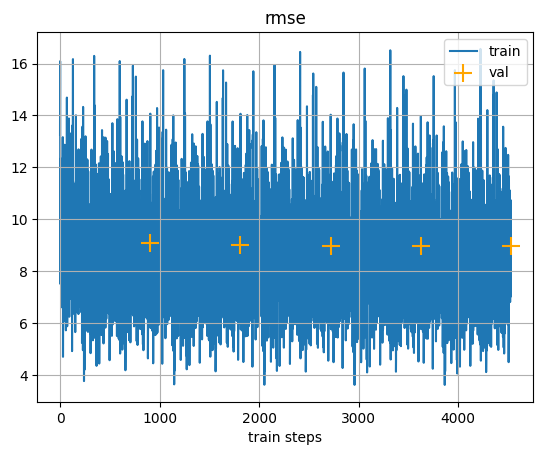

Train loss: 0.6575011014938354
Train acc: 8.308147430419922
Val loss: 0.7800833582878113
Val acc: 8.95818042755127
val_rmse_log [9.092701, 9.01159, 8.979912, 8.963204, 8.95818]


In [113]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.BatchNorm1d(90), nn.Linear(90, 300), nn.ReLU(), nn.BatchNorm1d(300), nn.Linear(300, 100), nn.ReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

#add dropout:

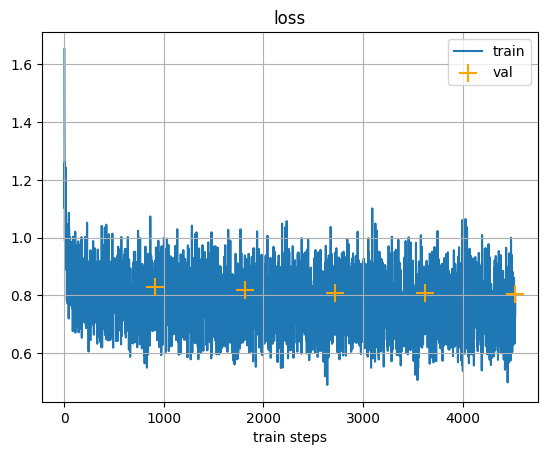

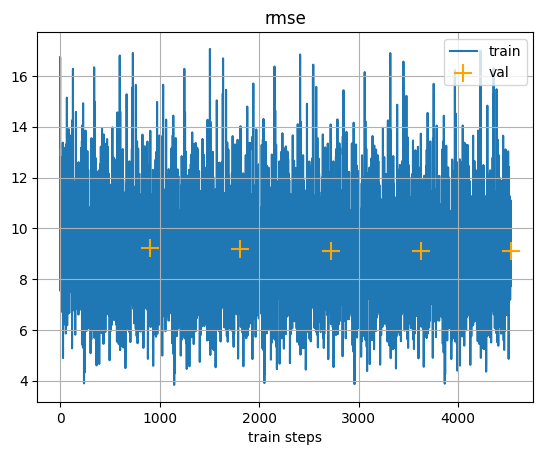

Train loss: 0.7538445591926575
Train acc: 8.907041549682617
Val loss: 0.8037487864494324
Val acc: 9.093048095703125
val_rmse_log [9.241282, 9.1823225, 9.124166, 9.123963, 9.093048]


In [114]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.BatchNorm1d(90), nn.Dropout(0.25), nn.Linear(90, 300), nn.ReLU(), nn.BatchNorm1d(300), nn.Linear(300, 100), nn.ReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

#change dropout(0.25) to dropout(0.1)

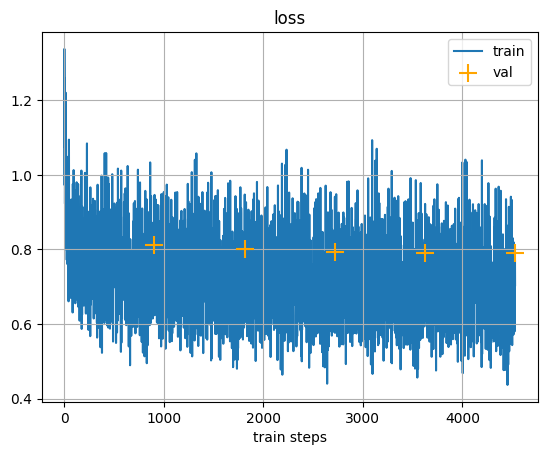

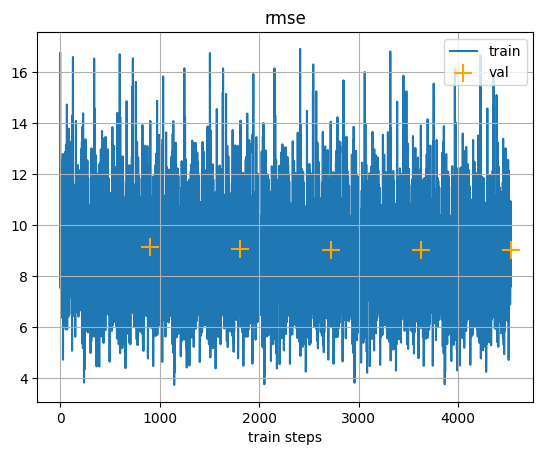

Train loss: 0.7050343155860901
Train acc: 8.607471466064453
Val loss: 0.7901822924613953
Val acc: 9.015979766845703
val_rmse_log [9.143099, 9.081442, 9.029934, 9.017281, 9.015981]


In [115]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.BatchNorm1d(90), nn.Dropout(0.1), nn.Linear(90, 300), nn.ReLU(), nn.BatchNorm1d(300), nn.Linear(300, 100), nn.ReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

##change relu to leakyrelu. delete dropout

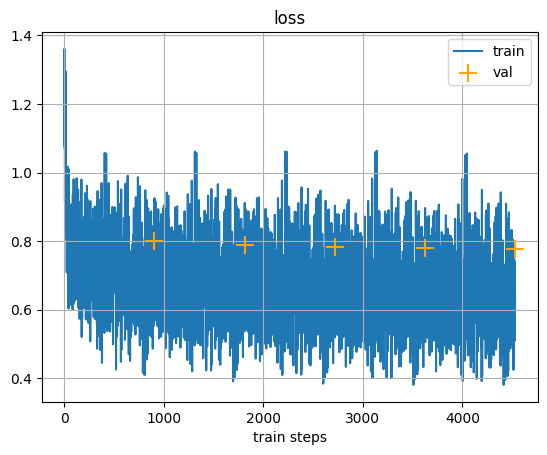

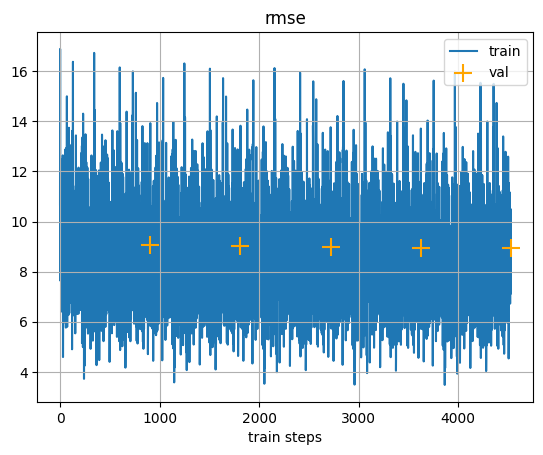

Train loss: 0.6463706493377686
Train acc: 8.23408317565918
Val loss: 0.7784571647644043
Val acc: 8.94883918762207
val_rmse_log [9.077032, 9.005026, 8.970014, 8.954936, 8.948838]


In [116]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 300), nn.LeakyReLU(), nn.BatchNorm1d(300), nn.Linear(300, 100), nn.LeakyReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

##add dropout

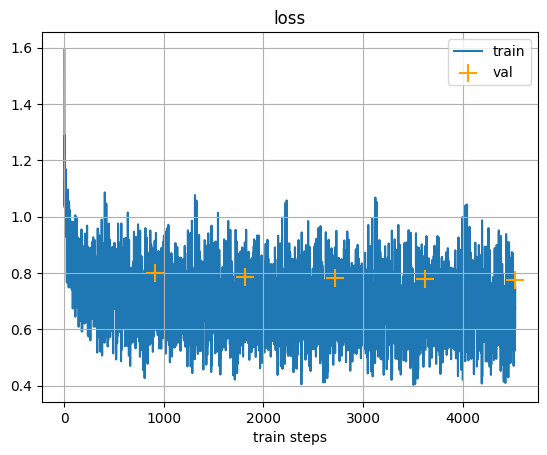

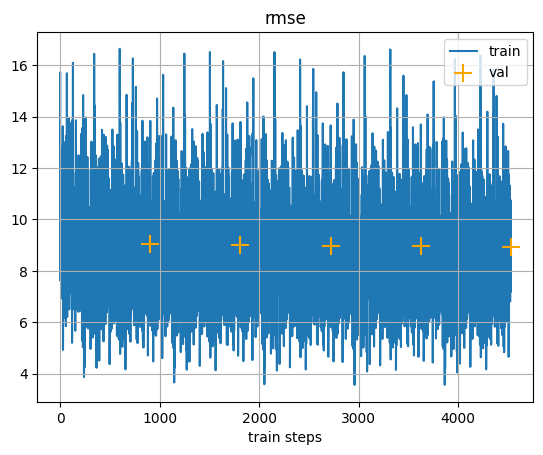

Train loss: 0.670648992061615
Train acc: 8.391929626464844
Val loss: 0.7762097120285034
Val acc: 8.935911178588867
val_rmse_log [9.061552, 8.990304, 8.970684, 8.948061, 8.935911]


In [117]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 300), nn.LeakyReLU(), nn.BatchNorm1d(300), nn.Dropout(), nn.Linear(300, 100), nn.LeakyReLU(), nn.BatchNorm1d(100), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

#изменим порядок слоев

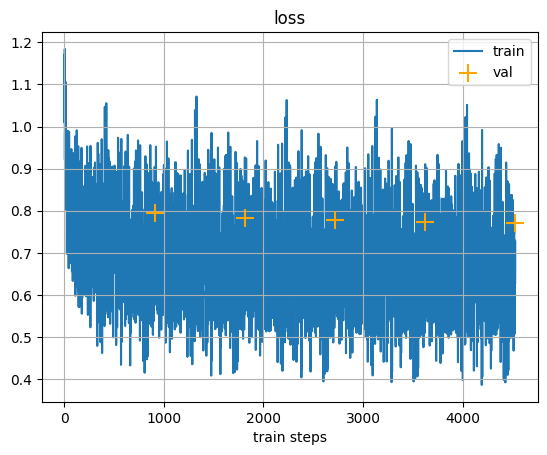

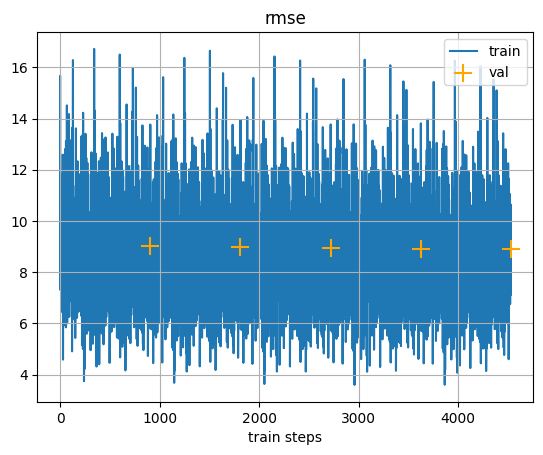

Train loss: 0.6618409752845764
Train acc: 8.334821701049805
Val loss: 0.7715578079223633
Val acc: 8.909093856811523
val_rmse_log [9.036254, 8.977412, 8.947748, 8.917332, 8.909094]


In [118]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 100),  nn.BatchNorm1d(100), nn.LeakyReLU(), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

##добавим больше слоев и получим rmse <= 8.9

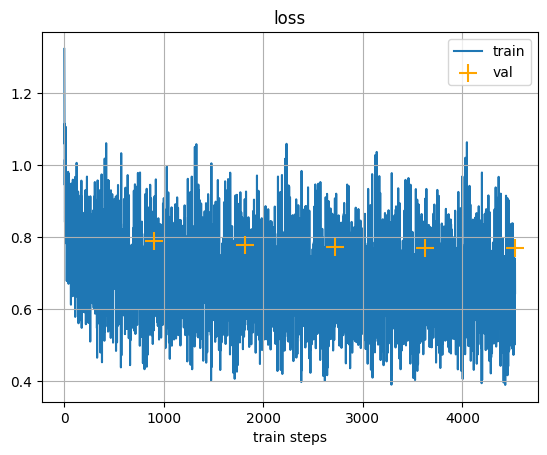

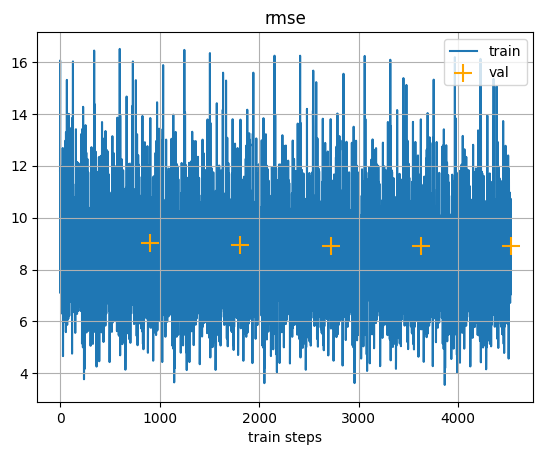

Train loss: 0.6598484516143799
Train acc: 8.320982933044434
Val loss: 0.7696107029914856
Val acc: 8.897845268249512
val_rmse_log [9.01475, 8.949584, 8.92402, 8.905986, 8.897845]


In [119]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 100),  nn.BatchNorm1d(100), nn.LeakyReLU(), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

#Увеличим число нейронов в Linear

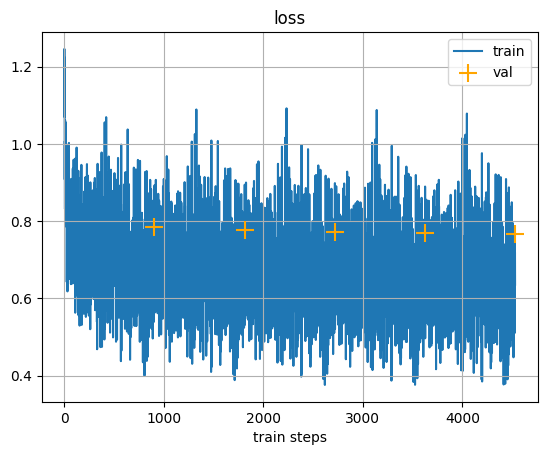

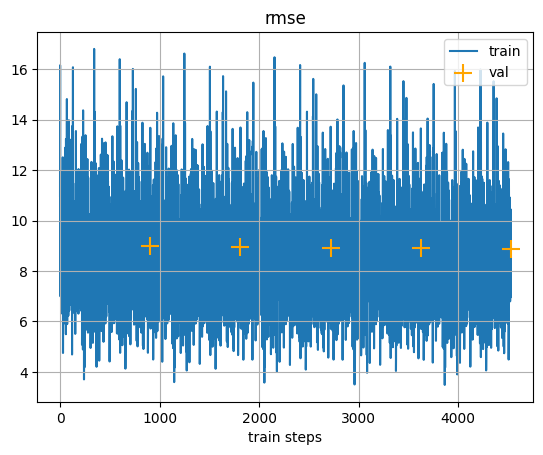

Train loss: 0.6475303173065186
Train acc: 8.240579605102539
Val loss: 0.7664368152618408
Val acc: 8.87947940826416
val_rmse_log [8.992523, 8.9365635, 8.914722, 8.901038, 8.879479]


In [120]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(500, 500), nn.BatchNorm1d(500), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(500, 100),  nn.BatchNorm1d(100), nn.LeakyReLU(), nn.Linear(100, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 5)

##find the best combination of neirons

In [ ]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)
for x in [10, 100, 300, 500]:
  for y in [100, 10, 300, 500]:
    for z in [500, 10, 300]:
      print(x, y, z)
      model = nn.Sequential(nn.Linear(90, x), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(x, y), nn.BatchNorm1d(y), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(y, z),  nn.BatchNorm1d(z), nn.LeakyReLU(), nn.Linear(z, 1))
      optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
      #scheduler = ExponentialLR(optimizer, gamma=0.9)
      criterion = nn.MSELoss()
      train_best_param(model, optimizer, criterion, train_loader1, test_loader1, True, 3)

10 100 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7073342800140381
Train acc: 8.625099182128906
Val loss: 0.7915983200073242
Val acc: 9.024055480957031
val_rmse_log [9.109355, 9.046625, 9.024055]
10 100 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7085416913032532
Train acc: 8.633715629577637
Val loss: 0.799609363079071
Val acc: 9.069602966308594
val_rmse_log [9.158272, 9.068891, 9.069602]
10 100 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.707012951374054
Train acc: 8.621861457824707
Val loss: 0.7996052503585815
Val acc: 9.069579124450684
val_rmse_log [9.190224, 9.11655, 9.069579]
10 10 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7188518643379211
Train acc: 8.697368621826172
Val loss: 0.8208020925521851
Val acc: 9.189004898071289
val_rmse_log [9.20785, 9.193817, 9.189006]
10 10 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7189269065856934
Train acc: 8.696433067321777
Val loss: 0.8108862042427063
Val acc: 9.133332252502441
val_rmse_log [9.272109, 9.17758, 9.133332]
10 10 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7175984978675842
Train acc: 8.688960075378418
Val loss: 0.8244947195053101
Val acc: 9.2096529006958
val_rmse_log [9.223514, 9.203843, 9.209653]
10 300 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7069849967956543
Train acc: 8.621854782104492
Val loss: 0.8072798252105713
Val acc: 9.11299991607666
val_rmse_log [9.184829, 9.133678, 9.113]
10 300 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7042310237884521
Train acc: 8.6065092086792
Val loss: 0.7911123037338257
Val acc: 9.021284103393555
val_rmse_log [9.133979, 9.042435, 9.021284]
10 300 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7035040259361267
Train acc: 8.600786209106445
Val loss: 0.7941418886184692
Val acc: 9.038541793823242
val_rmse_log [9.124545, 9.049996, 9.038542]
10 500 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7071670889854431
Train acc: 8.625444412231445
Val loss: 0.7950609922409058
Val acc: 9.043770790100098
val_rmse_log [9.178674, 9.071182, 9.043771]
10 500 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7018340229988098
Train acc: 8.5904541015625
Val loss: 0.7881788611412048
Val acc: 9.004542350769043
val_rmse_log [9.123578, 9.029884, 9.004543]
10 500 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.7068796157836914
Train acc: 8.622638702392578
Val loss: 0.8022229075431824
Val acc: 9.084412574768066
val_rmse_log [9.209362, 9.109153, 9.084413]
100 100 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6803956031799316
Train acc: 8.452631950378418
Val loss: 0.7753652334213257
Val acc: 8.931049346923828
val_rmse_log [9.045765, 8.968753, 8.931048]
100 100 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6739543676376343
Train acc: 8.409626007080078
Val loss: 0.7760298848152161
Val acc: 8.934876441955566
val_rmse_log [9.024147, 8.957386, 8.9348755]
100 100 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.679081916809082
Train acc: 8.4430513381958
Val loss: 0.7788255214691162
Val acc: 8.95095443725586
val_rmse_log [9.035784, 8.963135, 8.950955]
100 10 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6845858693122864
Train acc: 8.480473518371582
Val loss: 0.8086763620376587
Val acc: 9.120879173278809
val_rmse_log [9.1910925, 9.127845, 9.120879]
100 10 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6833215951919556
Train acc: 8.470906257629395
Val loss: 0.8057885766029358
Val acc: 9.104578018188477
val_rmse_log [9.134485, 9.130231, 9.104578]
100 10 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6845253705978394
Train acc: 8.478020668029785
Val loss: 0.8143288493156433
Val acc: 9.15269947052002
val_rmse_log [9.209741, 9.169927, 9.1527]
100 300 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6785327792167664
Train acc: 8.43924331665039
Val loss: 0.7778587937355042
Val acc: 8.945398330688477
val_rmse_log [9.032404, 8.985895, 8.945397]
100 300 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.673344612121582
Train acc: 8.407745361328125
Val loss: 0.7742683291435242
Val acc: 8.924729347229004
val_rmse_log [9.029978, 8.951139, 8.924729]
100 300 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6759548783302307
Train acc: 8.423791885375977
Val loss: 0.7754541039466858
Val acc: 8.931560516357422
val_rmse_log [9.049625, 8.974669, 8.9315605]
100 500 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6778821349143982
Train acc: 8.435872077941895
Val loss: 0.7774635553359985
Val acc: 8.943124771118164
val_rmse_log [9.016378, 8.961635, 8.943125]
100 500 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6715726256370544
Train acc: 8.39585018157959
Val loss: 0.7723890542984009
Val acc: 8.913891792297363
val_rmse_log [9.013243, 8.937101, 8.913891]
100 500 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6753836870193481
Train acc: 8.420342445373535
Val loss: 0.7818171381950378
Val acc: 8.968130111694336
val_rmse_log [9.087174, 9.020188, 8.96813]
300 100 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.672564685344696
Train acc: 8.401480674743652
Val loss: 0.774915337562561
Val acc: 8.92845630645752
val_rmse_log [9.024266, 8.96022, 8.928456]
300 100 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6669501662254333
Train acc: 8.365201950073242
Val loss: 0.7717344164848328
Val acc: 8.910113334655762
val_rmse_log [8.993718, 8.938668, 8.910113]
300 100 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6708928942680359
Train acc: 8.389212608337402
Val loss: 0.777164876461029
Val acc: 8.941407203674316
val_rmse_log [9.037211, 8.963494, 8.941407]
300 10 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6787824630737305
Train acc: 8.442028045654297
Val loss: 0.8043339252471924
Val acc: 9.096356391906738
val_rmse_log [9.149718, 9.118944, 9.096357]
300 10 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6782582998275757
Train acc: 8.438360214233398
Val loss: 0.8043727278709412
Val acc: 9.096575736999512
val_rmse_log [9.154229, 9.096839, 9.096577]
300 10 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6772046089172363
Train acc: 8.431568145751953
Val loss: 0.8085059523582458
Val acc: 9.119917869567871
val_rmse_log [9.242829, 9.145624, 9.119918]
300 300 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6698213815689087
Train acc: 8.3832368850708
Val loss: 0.7759047150611877
Val acc: 8.934155464172363
val_rmse_log [9.003232, 8.946974, 8.934155]
300 300 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6639071702957153
Train acc: 8.346428871154785
Val loss: 0.7705085873603821
Val acc: 8.903033256530762
val_rmse_log [8.97442, 8.927915, 8.903034]
300 300 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.668781042098999
Train acc: 8.376158714294434
Val loss: 0.7788639068603516
Val acc: 8.951175689697266
val_rmse_log [9.018417, 8.974514, 8.951177]
300 500 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6691456437110901
Train acc: 8.378661155700684
Val loss: 0.774937629699707
Val acc: 8.92858600616455
val_rmse_log [8.987645, 8.921471, 8.928586]
300 500 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6637707948684692
Train acc: 8.345525741577148
Val loss: 0.7689330577850342
Val acc: 8.893926620483398
val_rmse_log [8.972449, 8.921466, 8.893927]
300 500 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6682035326957703
Train acc: 8.374165534973145
Val loss: 0.7760241627693176
Val acc: 8.934843063354492
val_rmse_log [9.025868, 8.972757, 8.934843]
500 100 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6691667437553406
Train acc: 8.378578186035156
Val loss: 0.7744050025939941
Val acc: 8.925517082214355
val_rmse_log [9.020242, 8.947992, 8.925517]
500 100 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.664350152015686
Train acc: 8.348738670349121
Val loss: 0.7709854245185852
Val acc: 8.90578842163086
val_rmse_log [8.9884205, 8.942007, 8.905788]
500 100 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6679620742797852
Train acc: 8.37130069732666
Val loss: 0.7747284770011902
Val acc: 8.927380561828613
val_rmse_log [9.008684, 8.955024, 8.927381]
500 10 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6782842874526978
Train acc: 8.438947677612305
Val loss: 0.7918300032615662
Val acc: 9.025375366210938
val_rmse_log [9.100181, 9.063791, 9.025375]
500 10 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6756520867347717
Train acc: 8.421334266662598
Val loss: 0.8000370264053345
Val acc: 9.072027206420898
val_rmse_log [9.09924, 9.086797, 9.072027]
500 10 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6760901808738708
Train acc: 8.423848152160645
Val loss: 0.8164650797843933
Val acc: 9.164697647094727
val_rmse_log [9.192681, 9.186083, 9.164697]
500 300 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6669830679893494
Train acc: 8.364410400390625
Val loss: 0.7750253081321716
Val acc: 8.92909049987793
val_rmse_log [8.989801, 8.954614, 8.9290905]
500 300 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6609476804733276
Train acc: 8.327281951904297
Val loss: 0.7666312456130981
Val acc: 8.880605697631836
val_rmse_log [8.984917, 8.91503, 8.880606]
500 300 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6646561622619629
Train acc: 8.350674629211426
Val loss: 0.7788940072059631
Val acc: 8.951349258422852
val_rmse_log [8.9937315, 8.952913, 8.951349]
500 500 500


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6668459177017212
Train acc: 8.364068984985352
Val loss: 0.7736618518829346
Val acc: 8.921232223510742
val_rmse_log [9.0036335, 8.954932, 8.921232]
500 500 10


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6603974103927612
Train acc: 8.323688507080078
Val loss: 0.7704163193702698
Val acc: 8.902501106262207
val_rmse_log [9.006979, 8.942278, 8.902501]
500 500 300


Training, epoch 0:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 0:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 1:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 1:   0%|          | 0/101 [00:00<?, ?it/s]

Training, epoch 2:   0%|          | 0/906 [00:00<?, ?it/s]

Validating, epoch 2:   0%|          | 0/101 [00:00<?, ?it/s]

Train loss: 0.6646060943603516
Train acc: 8.3503999710083
Val loss: 0.7798410058021545
Val acc: 8.956789016723633
val_rmse_log [9.032201, 8.989313, 8.956788]


#LET'S TRY THIS MODEL ON 10 EPOCHS!

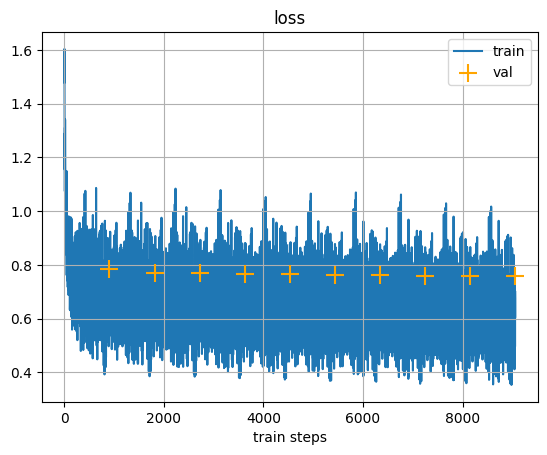

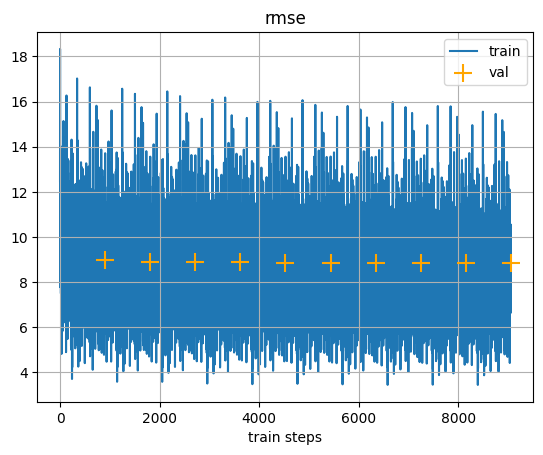

Train loss: 0.6224948167800903
Train acc: 8.076286315917969
Val loss: 0.7588714957237244
Val acc: 8.835546493530273
val_rmse_log [8.98085, 8.907587, 8.888896, 8.876681, 8.870047, 8.859245, 8.851215, 8.837047, 8.831933, 8.8355465]


In [121]:
model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(500, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 10),  nn.BatchNorm1d(10), nn.LeakyReLU(), nn.Linear(10, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
criterion = nn.MSELoss()
train(model, optimizer, criterion, train_loader1, test_loader1, True, 10)

##ADD SCHEDULER:

In [122]:
def train_sched(model, optimizer, criterion, train_loader, test_loader, target_norm, epochs, scheduler):

    scaler = StandardScaler()
    set_random_seed(42)

    train_loss_log, train_rmse_log, val_loss_log, val_rmse_log = [], [], [], []
    tr_epoch_loss = []
    tr_epoch_rmse = []
    test_losses = []
    test_rmses = []

    for epoch in range(epochs):
      model.train()
      train_epoch_loss, train_epoch_rmse = torch.empty(0), torch.empty(0)

      for x, y in tqdm(train_loader, desc=f"Training, epoch {epoch}", leave=False):
        y_pred = model(x)

        if target_norm:
          y = torch.from_numpy(scaler.fit_transform(y.reshape(-1, 1))).to(torch.float32) ##mal. zn-ya

        loss = criterion(y_pred, y.to(torch.float32))
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        if target_norm:
          y = torch.from_numpy(scaler.inverse_transform(y)).to(torch.float32) ##return to big
          y_pred = torch.from_numpy(scaler.inverse_transform(y_pred.detach().numpy())).to(torch.float32) ##return to big
        metric = torch.sqrt(criterion(y_pred, y))

        train_epoch_loss = torch.cat((train_epoch_loss, loss.cpu().unsqueeze(0)))
        train_loss_log.append(loss.cpu().data)
        train_epoch_rmse = torch.cat(
              (train_epoch_rmse, metric.cpu().unsqueeze(0))
          )
        train_rmse_log.append(metric.cpu().data)
        tr_epoch_loss.append(loss.cpu().data)
        tr_epoch_rmse.append(metric.cpu().data)
      scheduler.step()
      # валидация
      model.eval()
      val_epoch_loss, val_epoch_loss_for_metric = torch.empty(0), torch.empty(0)
      test_epoch_loss = []
      test_epoch_rmse = []
      with torch.no_grad():
        for x, y in tqdm(test_loader, desc=f"Validating, epoch {epoch}", leave=False):
          y_pred = model(x)

          if target_norm:
            y = torch.from_numpy(scaler.transform(y.reshape(-1, 1))).to(torch.float32) ##make small
          loss = criterion(y_pred, y)

          if target_norm:
            y_pred = torch.from_numpy(scaler.inverse_transform(y_pred.detach().numpy())).to(torch.float32)
            y = torch.from_numpy(scaler.inverse_transform(y.detach().numpy())).to(torch.float32)

          loss_for_metric = criterion(y_pred, y)

          val_epoch_loss = torch.cat((val_epoch_loss, loss.cpu().unsqueeze(0)))
          val_epoch_loss_for_metric = torch.cat((val_epoch_loss_for_metric, loss_for_metric.cpu().unsqueeze(0)))
          test_epoch_loss.append(loss.cpu().data)
          test_epoch_rmse.append(loss_for_metric.cpu().data)

        val_rmse_log.append(np.sqrt(np.mean(test_epoch_rmse)))
        val_loss_log.append(np.mean(test_epoch_loss))

      clear_output()
      plot_history(tr_epoch_loss, val_loss_log, "loss")
      plot_history(tr_epoch_rmse, val_rmse_log, "rmse")

      print("Train loss:", train_epoch_loss.mean().item())
      print(
            "Train acc:", train_epoch_rmse.mean().item(),
      )
      print("Val loss:", val_epoch_loss.mean().item())
      print(
            "Val acc:", torch.sqrt(val_epoch_loss_for_metric.mean()).item(),
      )
      print('val_rmse_log', val_rmse_log)


In [124]:
from torch.optim.lr_scheduler import  StepLR, ExponentialLR

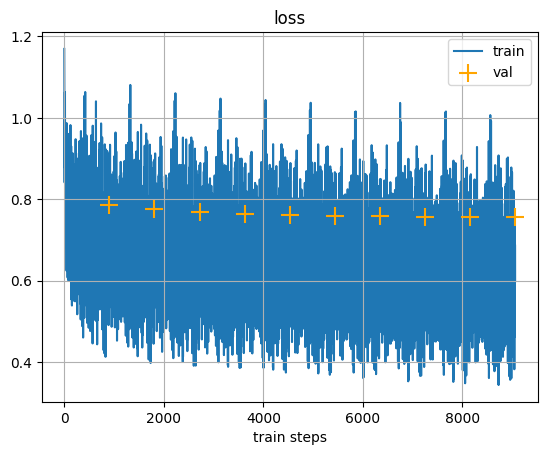

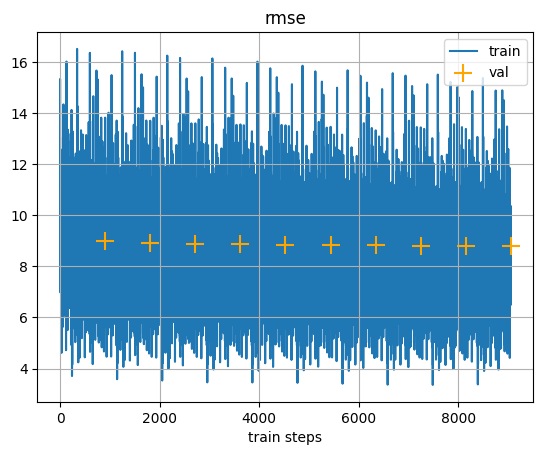

Train loss: 0.6114221215248108
Train acc: 8.003682136535645
Val loss: 0.7562129497528076
Val acc: 8.820056915283203
val_rmse_log [8.996013, 8.936111, 8.900329, 8.86701, 8.849904, 8.840231, 8.831375, 8.822135, 8.817427, 8.820056]


In [125]:
model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(500, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 10),  nn.BatchNorm1d(10), nn.LeakyReLU(), nn.Linear(10, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ExponentialLR(optimizer, gamma=0.8)
criterion = nn.MSELoss()
train_sched(model, optimizer, criterion, train_loader1, test_loader1, True, 10, scheduler)

#MORE EPOCHS AND GET <= 8.8

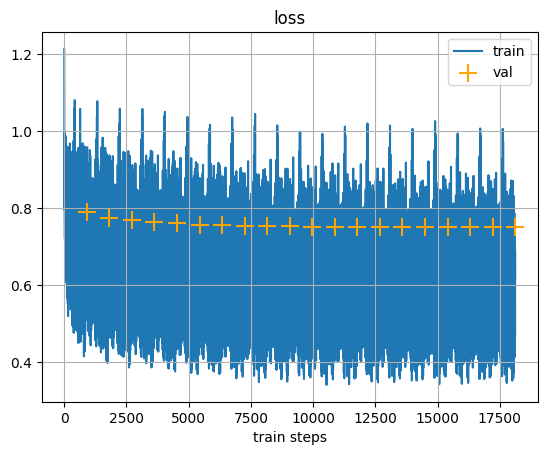

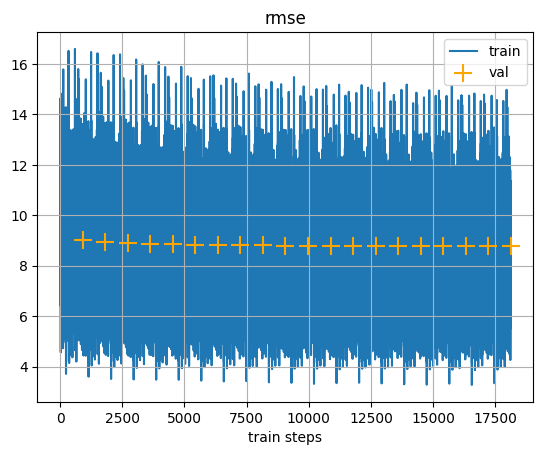

Train loss: 0.5973618030548096
Train acc: 7.908413887023926
Val loss: 0.7506131529808044
Val acc: 8.787339210510254
val_rmse_log [9.008962, 8.93088, 8.898293, 8.861713, 8.851701, 8.827664, 8.825452, 8.812119, 8.810124, 8.801467, 8.795891, 8.796089, 8.792187, 8.79432, 8.79248, 8.792131, 8.79056, 8.787695, 8.787422, 8.787339]


In [126]:
model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(500, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 10),  nn.BatchNorm1d(10), nn.LeakyReLU(), nn.Linear(10, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ExponentialLR(optimizer, gamma=0.8)
criterion = nn.MSELoss()
train_sched(model, optimizer, criterion, train_loader1, test_loader1, True, 20, scheduler)

#Попробуем другой scheduler

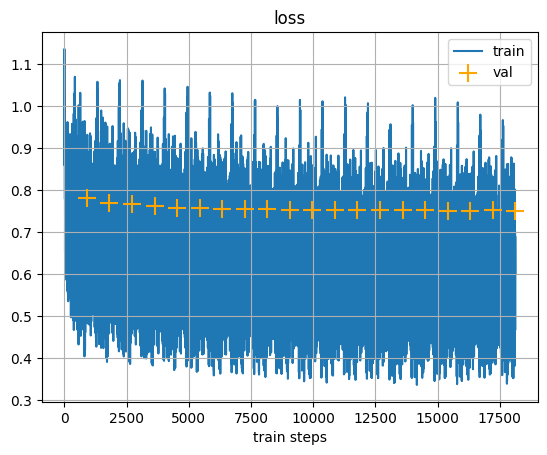

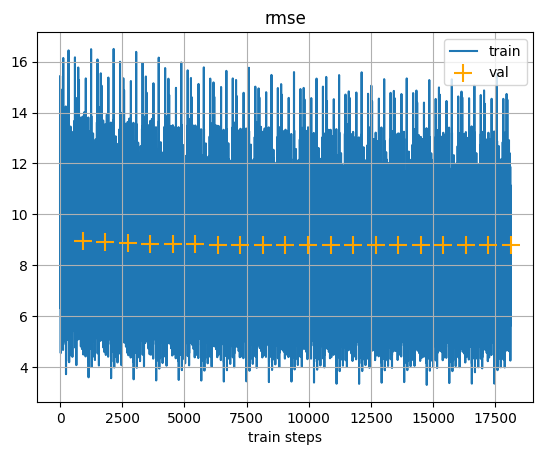

Train loss: 0.5967745184898376
Train acc: 7.905231475830078
Val loss: 0.7516292929649353
Val acc: 8.793285369873047
val_rmse_log [8.968343, 8.902202, 8.878845, 8.853427, 8.828781, 8.824475, 8.815963, 8.810717, 8.814956, 8.804236, 8.802381, 8.801707, 8.799635, 8.797847, 8.797549, 8.797905, 8.793767, 8.792689, 8.799613, 8.793285]


In [127]:
model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(500, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 10),  nn.BatchNorm1d(10), nn.LeakyReLU(), nn.Linear(10, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lambda1 = lambda epoch: 0.8 ** epoch
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)
criterion = nn.MSELoss()
train_sched(model, optimizer, criterion, train_loader1, test_loader1, True, 20, scheduler)

##increase p in first dropout and epochs = 20. rmse = 8.78

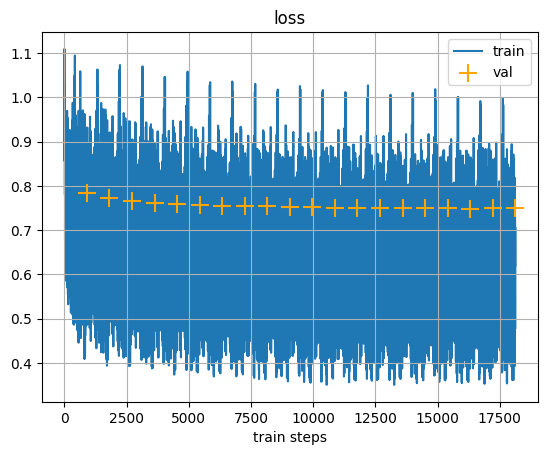

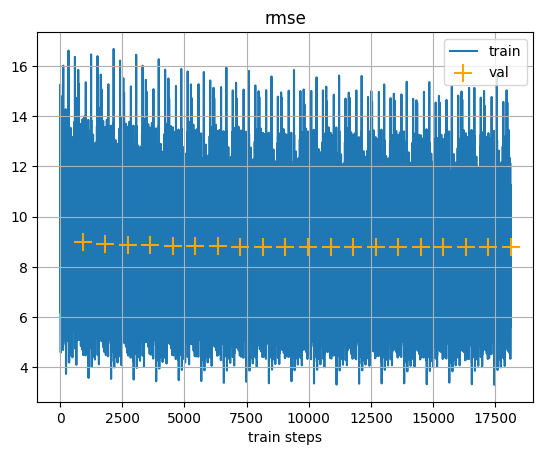

Train loss: 0.607105016708374
Train acc: 7.974692344665527
Val loss: 0.7492481470108032
Val acc: 8.779345512390137
val_rmse_log [8.9753895, 8.91209, 8.880708, 8.8564415, 8.835136, 8.826332, 8.814931, 8.809324, 8.806013, 8.79631, 8.796683, 8.79061, 8.788862, 8.788121, 8.784294, 8.781493, 8.783057, 8.777118, 8.781503, 8.779345]


In [128]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.3), nn.Linear(500, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 10),  nn.BatchNorm1d(10), nn.LeakyReLU(), nn.Linear(10, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lambda1 = lambda epoch: 0.8 ** epoch
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)
criterion = nn.MSELoss()
train_sched(model, optimizer, criterion, train_loader1, test_loader1, True, 20, scheduler)

##try the same on 30 epochs

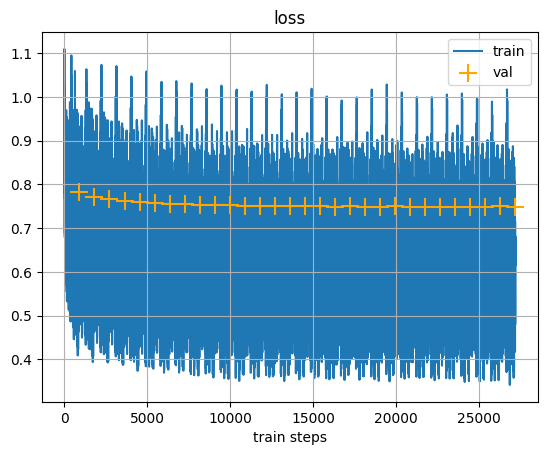

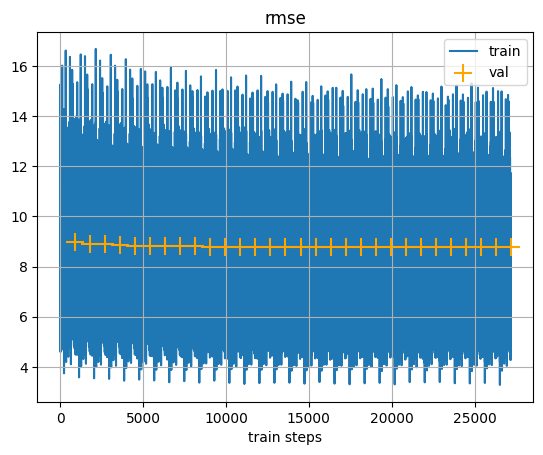

Train loss: 0.6059951186180115
Train acc: 7.967840194702148
Val loss: 0.7491028904914856
Val acc: 8.778494834899902
val_rmse_log [8.9753895, 8.91209, 8.880708, 8.8564415, 8.835136, 8.826332, 8.814931, 8.809324, 8.806013, 8.79631, 8.796683, 8.79061, 8.788862, 8.788121, 8.784294, 8.781493, 8.783057, 8.777118, 8.781503, 8.779345, 8.778555, 8.780643, 8.778028, 8.777717, 8.779266, 8.775913, 8.775974, 8.778233, 8.78209, 8.778495]


In [129]:
train_set1 = MyDataset(X_train1, y_train)
train_loader1 = torch.utils.data.DataLoader(train_set1, batch_size=512)

test_set1 = MyDataset(X_test1, y_test)
test_loader1 = torch.utils.data.DataLoader(test_set1, batch_size=512)

model = nn.Sequential(nn.Linear(90, 500), nn.LeakyReLU(), nn.Dropout(0.3), nn.Linear(500, 300), nn.BatchNorm1d(300), nn.LeakyReLU(), nn.Dropout(0.2), nn.Linear(300, 10),  nn.BatchNorm1d(10), nn.LeakyReLU(), nn.Linear(10, 1))
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lambda1 = lambda epoch: 0.8 ** epoch
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)
criterion = nn.MSELoss()
train_sched(model, optimizer, criterion, train_loader1, test_loader1, True, 30, scheduler)

## Задание 3. (0 баллов, но при невыполнении максимум за все задание &mdash; 0 баллов)

Напишите небольшой отчет о том, как вы добились полученного качества: какие средства использовали и какие эксперименты проводили. Подробно расскажите об архитектурах и значениях гиперпараметров, а также какие метрики на тесте они показывали. Чтобы отчет был зачтен, необходимо привести хотя бы 3 эксперимента.

Значительные улучшения были замечены сначала при проведении нормализации X, а затем и таргета.

Далее метрика сильно уменьшилась при усложнении архитектуры, добалении нескольких линейных слоев и функций RELU.

Батч нормализация также привела к улучшению качества модели. Я попробовала различные ее расположения в модели. Дропаут - прикрасная регуляризация! Однако надо быть осторожным, применяя Dropout и BatchNorm вместе. Об этом я узнала из семинара по машинному обучению от МФТИ (https://yandex.ru/video/preview/10001870262184912612).

Замена ReLU на LeakyReLU привела к улучшению.

Оптимизатор Adam оказался лучше SGD, AdamW, RMSProp.

Я попробовала различные количества inputs and output в Linear(), различные learning rates, batchsizes методом перебора и выбрала оптимальные.



## Моя действия и значения RMSE после них:
* Нормализация X - 10.83
* Уменьшение шага - 10.94
* Норм таргет и шаг 0.0001 - 9.768. С шагом 0.001 – 9.749
* Перебором показатели были лучшие при batch-size = 512 and lr = 0.01. – 9.599
* При batch-size = 512 and lr = 0.01 и архитектуре Linear(90, 100) ReLU, BatchNorm, Limear(100, 1) – 9.07
* Изменив архитектуру на Linear(90, 300), relu, batchnorm, linear(300, 100), relu
, batchnorm, linear – 8.94
* Добавив в начало батчнорм Batchnorm, linear(90, 300), relu, batchnorm, linear(300, 100), relu, batchnorm, linear – немного хуже стало – 8.958
* Добавив после первого батчнорма дропаут с p=0.25 – 9.09
* Уменьшив p до 0.1 – 9.14.
* Взяла снова другую архитектуру, убрав дропауты и изменила relu на leakyrelu: 8.94
* При Linear(90, 300), LeakyReLU, BatchNorm1d(300), Dropout(), Linear(300, 100), LeakyReLU(), BatchNorm1d(100), Linear(100, 1) – 8.936
* Изменив порядок слоев на Linear(90, 300), BatchNorm1d, LeakyReLU, Dropout(0.2), nn.Linear(300, 100),  BatchNorm1d, LeakyReLU, Linear(100, 1) получила 8.909
* Добавила больше слоев и получила8.897
* Увеличила число нейронов в линеар – 8.8794.
* Методом перебора выянила, что лучшее качество получается при большом количестве нейронов и постепенном уменьшении: 90-500-300-10. 8.83
* С scheduler-ом ExponentialLR удалось добиться 8.82 на 10 эпохах. При 20 эпохах с ним – 8.7873.
* При LambdaLR и уменьшении p в дропауте до 0.1 – 8.779345.
* а на 30 эпохах - 8.778



Нашла на просторах Интернета: https://colab.research.google.com/github/GilesStrong/PyTorch_Tutorial/blob/master/notebooks/5_Regression_Application_Completed.ipynb#scrollTo=gVbKrxWEq6D0

Активно использовала код с семинаров.



##Выводы:
Хорошо побобранная архитектура, нормализация и регуляризация позволяют добиться результатов.